In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go

In [2]:
df=pd.read_csv("../data/processed/preprocessed.csv")

In [3]:
df.head(3)

,Registration Year,Insurance,Fuel Type,Seats,Kms Driven,RTO,Ownership,Transmission,Year of Manufacture,Power in bhp,Mileage in kmpl or km/kg,new_vehical_price_in_lakh_inr,vehical_price_in_lakh_inr,other_features,company_name,model_detail,Engine Displacement in cc
0,2013,No Insurance,Diesel,5 Seats,150000,Sri Ganganagar,Fourth Owner,Manual,2013,67.04,23.59,8.05,2.60,[],Toyota,Etios GD,1364.0
1,2024,No Insurance,Petrol,5 Seats,10000,dasuya,First Owner,Manual,2024,88.50,22.35,11.28,9.40,[],Toyota,Glanza V,1197.0
2,2017,Comprehensive,Diesel,5 Seats,75000,Gurgaon,First Owner,Manual,2017,88.70,22.10,11.86,6.25,[],Hyundai,Creta 1.4 E Plus,1396.0


In [4]:
# graph ideas
# no of owners vs year
# side by side graph of registration year and year of manifacture

# Registration year

In [5]:
px.pie(values=df['Registration Year '].value_counts().values,names=df['Registration Year '].value_counts().index)

In [6]:
fig=px.bar(y=df['Registration Year '].value_counts().values,
       x=df['Registration Year '].value_counts().index,text_auto=True,
       color=['red' if i%2==0 else 'blue' for i in range(len(df['Registration Year '].value_counts()))])
fig.update_layout(xaxis_title='Year of Registration',yaxis_title='no of cars for sale')

# Year of Manufacture

In [7]:
px.pie(values=df['Year of Manufacture '].value_counts().values,names=df['Year of Manufacture '].value_counts().index)

In [8]:
fig=px.bar(y=df['Year of Manufacture '].value_counts().values,
       x=df['Year of Manufacture '].value_counts().index,
           text=[f"{round(i,2)}%" for i in df['Year of Manufacture '].value_counts().values*100/df.shape[0]],
       color=['red' if i%2==0 else 'blue' for i in range(len(df['Year of Manufacture '].value_counts()))])
fig.update_layout(xaxis_title='Year of Manufacture',yaxis_title='no of cars for sale')

In [9]:
fig=px.bar(y=df['Year of Manufacture '].value_counts().sort_index().cumsum().values,
       x=df['Year of Manufacture '].value_counts().sort_index().cumsum().index,
           text=[f"{round(i,2)}%" for i in df['Year of Manufacture '].value_counts().sort_index().cumsum().values*100/df.shape[0]],
       color=['red' if i%2==0 else 'blue' for i in range(len(df['Year of Manufacture '].value_counts()))])
fig.update_layout(xaxis_title='Year of Manufacture',yaxis_title='no of cars for sale (cumulative sum)')

# Insurance

In [10]:
px.pie(values=df['Insurance '].value_counts().values,names=df['Insurance '].value_counts().index)

In [11]:
fig=px.bar(y=df['Insurance '].value_counts().values,
       x=df['Insurance '].value_counts().index,text_auto=True,
       color=['red' if i%2==0 else 'blue' for i in range(len(df['Insurance '].value_counts()))])
fig.update_layout(xaxis_title='Insurance type',yaxis_title='no of cars for sale')

# Fuel Type

In [12]:
px.pie(values=df['Fuel Type '].value_counts().values,names=df['Fuel Type '].value_counts().index)

# Seats

In [13]:
px.pie(values=df['Seats '].value_counts().values,names=df['Seats '].value_counts().index)

In [14]:
fig=px.bar(y=df['Seats '].value_counts().values,
       x=df['Seats '].value_counts().index,text_auto=True,
       color=['red' if i%2==0 else 'blue' for i in range(len(df['Seats '].value_counts()))])
fig.update_layout(xaxis_title='Seats',yaxis_title='no of cars for sale')

# KMS driven

In [15]:
df['Kms Driven '].describe()

count    1.001100e+04
mean     7.916136e+04
std      2.046022e+05
min      2.500000e+02
25%      4.000000e+04
50%      7.000000e+04
75%      1.000000e+05
max      1.860000e+07
Name: Kms Driven , dtype: float64

In [16]:
counts, edges = np.histogram(df['Kms Driven '], bins=[0, 1000, 10000, 25000,50000,75000, 100000,150000,200000,500000, 10000000])
bin_labels = [f"{int(edges[i])}–{int(edges[i+1])}" for i in range(len(edges)-1)]
px.bar(y=counts,x=bin_labels)

# RTO

In [17]:
val_cnt=df['RTO '].value_counts()

In [18]:
# just for visualization marking all rtos which appear less than 50 times as others 
for val,ind in zip(val_cnt.values,val_cnt.index):
    if val<50:
        val_cnt.loc['Others']+=val
        val_cnt.drop(ind,inplace=True)

In [19]:
px.pie(values=val_cnt.values,names=val_cnt.index,width=1000,height=600)

In [20]:
fig=px.bar(y=val_cnt.values,x=val_cnt.index,log_y=True)
fig.update_layout(xaxis_title='RTO name',yaxis_title='no of cars')

# Ownership

In [21]:
px.pie(values=df['Ownership '].value_counts().values,names=df['Ownership '].value_counts().index)

In [22]:
fig=px.bar(y=df['Ownership '].value_counts().values,
       x=df['Ownership '].value_counts().index,text_auto=True,
       color=['red' if i%2==0 else 'blue' for i in range(len(df['Ownership '].value_counts()))])
fig.update_layout(xaxis_title='Ownership ',yaxis_title='no of cars for sale')

# Engine Displacement

In [23]:
df['Engine Displacement in cc'].describe()

count    10011.000000
mean      1417.001714
std        446.701226
min        624.000000
25%       1197.000000
50%       1248.000000
75%       1498.000000
max       4951.000000
Name: Engine Displacement in cc, dtype: float64

In [24]:
px.box(df['Engine Displacement in cc'])

In [25]:
px.histogram(df['Engine Displacement in cc'])

# Transmission

In [26]:
df['Transmission '].value_counts()

Transmission 
Manual       8364
Automatic    1647
Name: count, dtype: int64

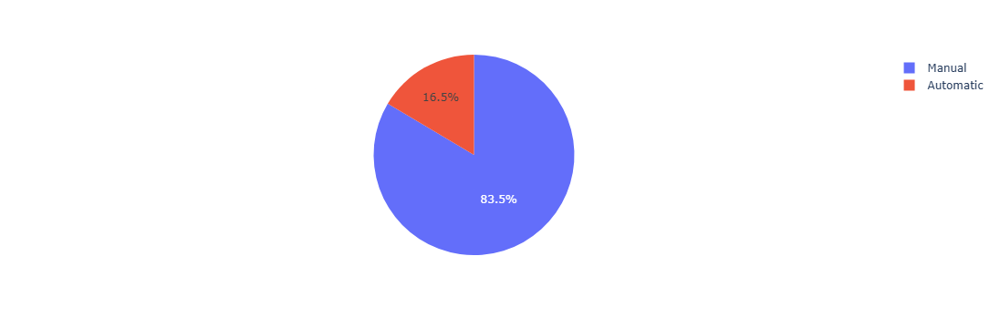

In [28]:
px.pie(values=df['Transmission '].value_counts().values,names=df['Transmission '].value_counts().index)

# Power in bhp

In [29]:
df['Power in bhp'].describe()

count    10011.000000
mean        97.966351
std         37.194509
min         32.800000
25%         74.000000
50%         87.000000
75%        113.496186
max        395.000000
Name: Power in bhp, dtype: float64

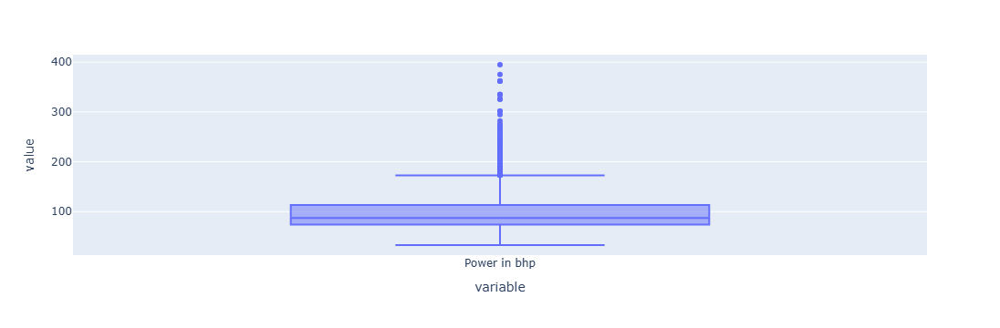

In [30]:
px.box(df['Power in bhp'])

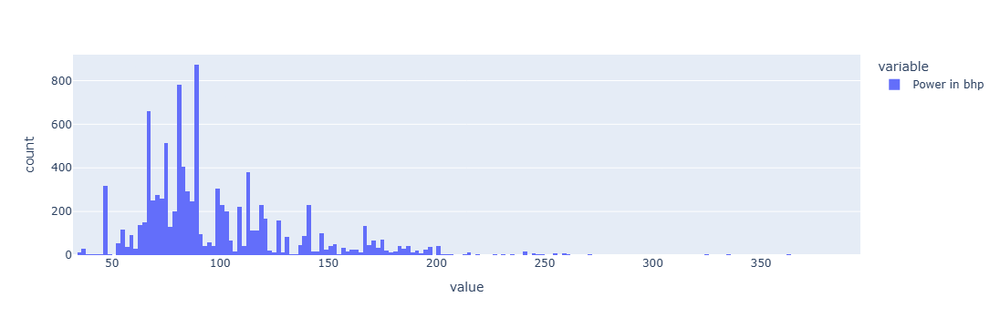

In [31]:
px.histogram(df['Power in bhp'])

# Mileage in kmpl or km/kg

In [32]:
df['Mileage in kmpl or km/kg'].describe()

count    10011.000000
mean        19.670380
std          3.848499
min          5.400000
25%         17.050000
50%         19.668163
75%         22.100000
max         35.600000
Name: Mileage in kmpl or km/kg, dtype: float64

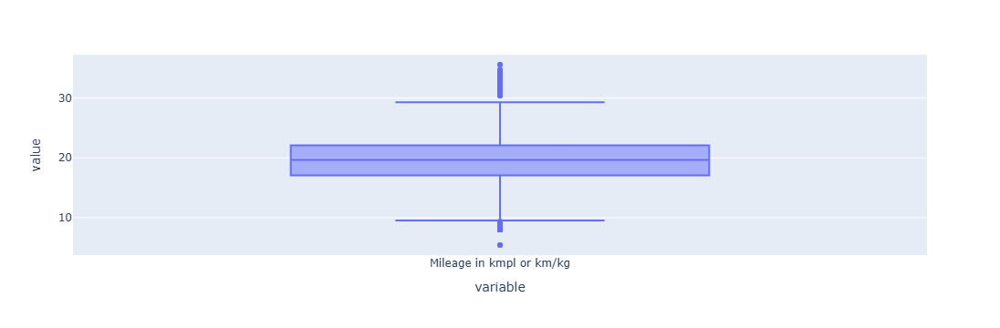

In [33]:
px.box(df['Mileage in kmpl or km/kg'])

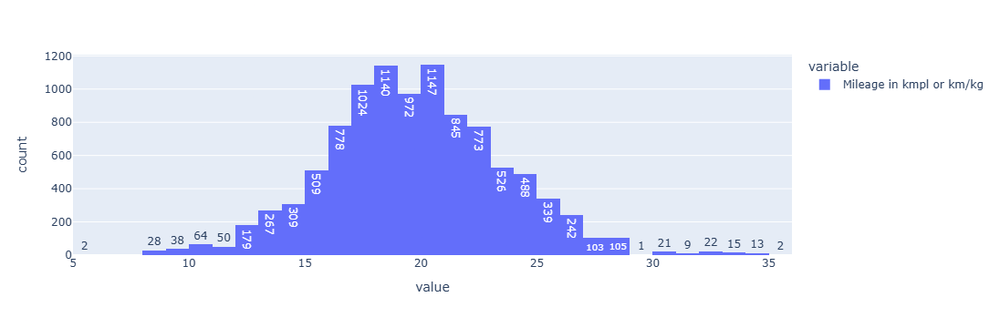

In [34]:
px.histogram(df['Mileage in kmpl or km/kg'],nbins=50,text_auto=True)

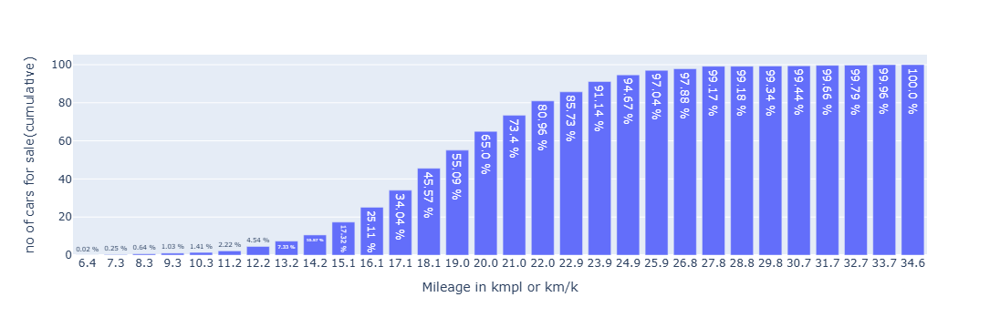

In [35]:
from sklearn.preprocessing import KBinsDiscretizer
kb=KBinsDiscretizer(n_bins=31,encode='ordinal',strategy="uniform")
cum_df=pd.DataFrame(df['Mileage in kmpl or km/kg'].value_counts().sort_index())
cum_df['bins']=kb.fit_transform(np.array(cum_df.index).reshape(cum_df.shape[0],1))
cum_df=cum_df.groupby('bins')['count'].sum().cumsum()*100/df.shape[0]
ranges=[f"{np.round(kb.bin_edges_[0][i+1],1)}" for i in range(30)]
fig=px.bar(x=ranges,y=cum_df.values,text=[f"{round(i,2)} %" for i in cum_df.values])
fig.update_layout(xaxis_title='Mileage in kmpl or km/k',yaxis_title='no of cars for sale(cumulative)')

<Axes: xlabel='Mileage in kmpl or km/kg', ylabel='Density'>

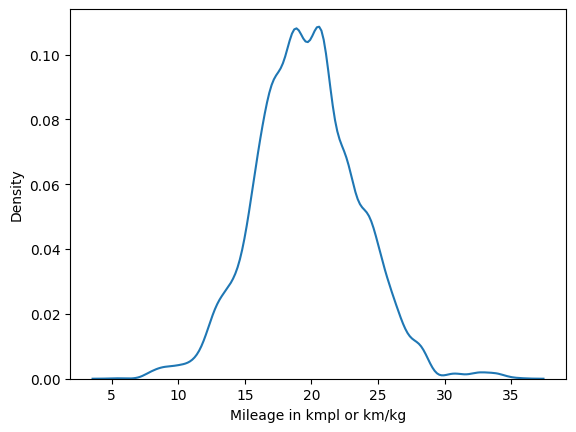

In [37]:
sns.kdeplot(df['Mileage in kmpl or km/kg'])

# new_vehical_price_in_lakh_inr

In [38]:
df['new_vehical_price_in_lakh_inr'].describe()

count    10011.000000
mean        13.195201
std         12.767637
min          1.450000
25%          6.930000
50%          9.610000
75%         14.365000
max        174.000000
Name: new_vehical_price_in_lakh_inr, dtype: float64

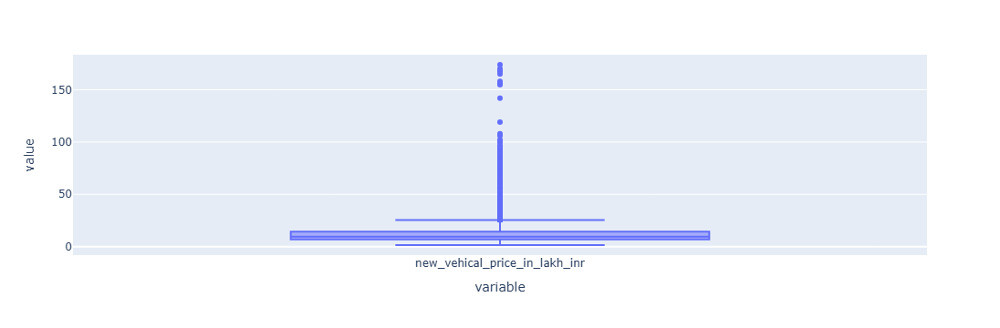

In [39]:
px.box(df['new_vehical_price_in_lakh_inr'])

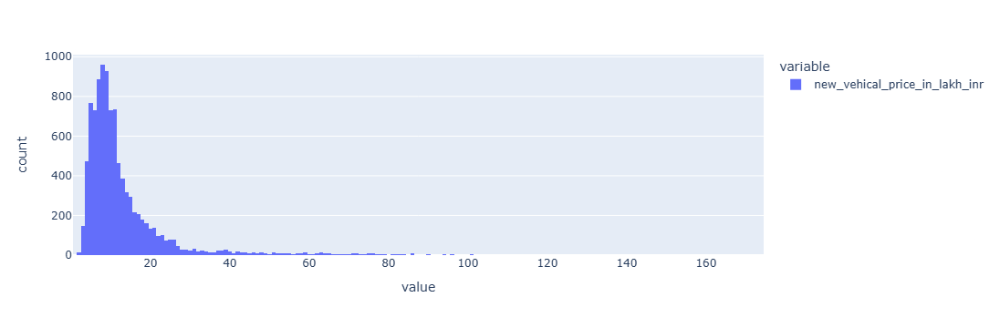

In [40]:
px.histogram(df['new_vehical_price_in_lakh_inr'])

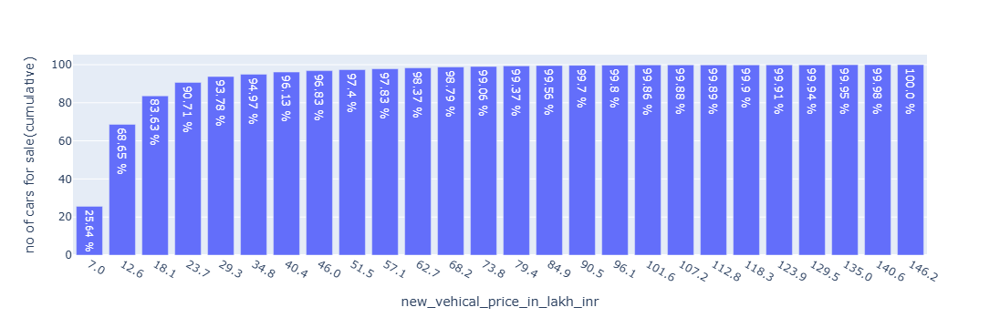

In [41]:
from sklearn.preprocessing import KBinsDiscretizer
kb=KBinsDiscretizer(n_bins=31,encode='ordinal',strategy="uniform")
cum_df=pd.DataFrame(df['new_vehical_price_in_lakh_inr'].value_counts().sort_index())
cum_df['bins']=kb.fit_transform(np.array(cum_df.index).reshape(cum_df.shape[0],1))
cum_df=cum_df.groupby('bins')['count'].sum().cumsum()*100/df.shape[0]
ranges=[f"{np.round(kb.bin_edges_[0][i+1],1)}" for i in range(26)]
fig=px.bar(x=ranges,y=cum_df.values,text=[f"{round(i,2)} %" for i in cum_df.values])
fig.update_layout(xaxis_title='new_vehical_price_in_lakh_inr',yaxis_title='no of cars for sale(cumulative)')

# vehical_price_in_lakh_inr

In [42]:
df['vehical_price_in_lakh_inr'].describe()

count    10011.000000
mean         7.348872
std          7.588544
min          0.100000
25%          3.200000
50%          5.500000
75%          8.985000
max        148.000000
Name: vehical_price_in_lakh_inr, dtype: float64

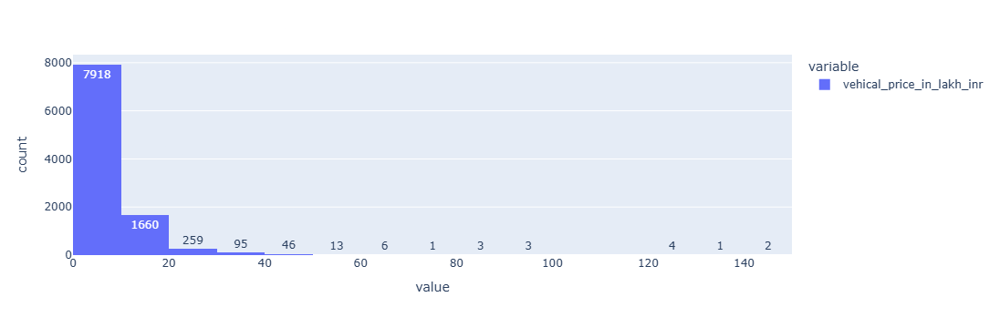

In [43]:
px.histogram(df['vehical_price_in_lakh_inr'],nbins=22,text_auto=True)

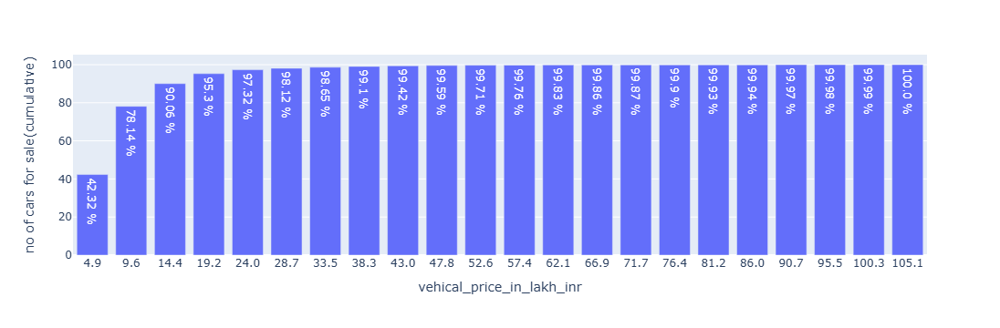

In [44]:
from sklearn.preprocessing import KBinsDiscretizer
kb=KBinsDiscretizer(n_bins=31,encode='ordinal',strategy="uniform")
cum_df=pd.DataFrame(df['vehical_price_in_lakh_inr'].value_counts().sort_index())
cum_df['bins']=kb.fit_transform(np.array(cum_df.index).reshape(cum_df.shape[0],1))
cum_df=cum_df.groupby('bins')['count'].sum().cumsum()*100/df.shape[0]
ranges=[f"{np.round(kb.bin_edges_[0][i+1],1)}" for i in range(22)]
fig=px.bar(x=ranges,y=cum_df.values,text=[f"{round(i,2)} %" for i in cum_df.values])
fig.update_layout(xaxis_title='vehical_price_in_lakh_inr',yaxis_title='no of cars for sale(cumulative)')

# other_features

In [45]:
import ast

In [46]:
df['other_features']=df['other_features'].apply(ast.literal_eval)

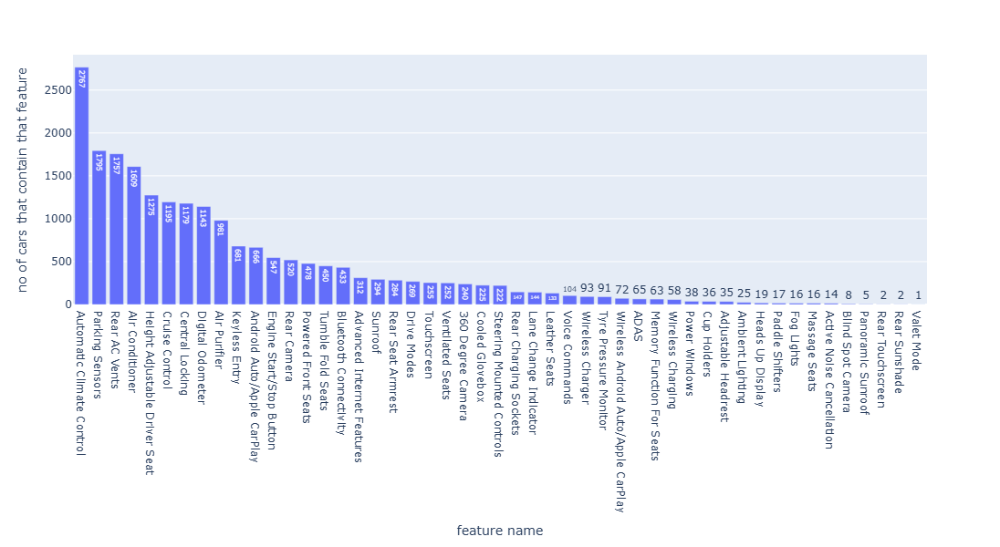

In [47]:
add_features=[]
for i in df['other_features'].values:
    add_features+=i
    
count_fea={}
for i in add_features:
    count_fea[i]=count_fea.get(i,0)+1
count_fea_sor=sorted(count_fea,key=lambda x:1/count_fea[x])
fig=px.bar(x=count_fea_sor,y=[count_fea[i] for i in count_fea_sor],height=600,text_auto=True)
fig.update_layout(xaxis_title="feature name",yaxis_title='no of cars that contain that feature')

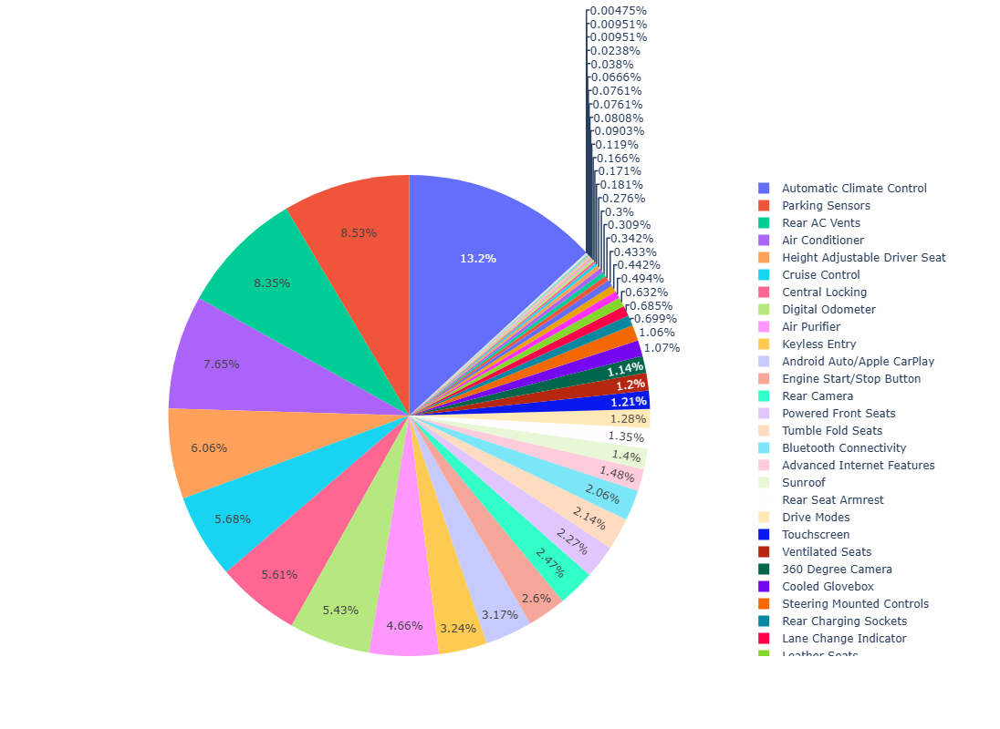

In [48]:
px.pie(names=count_fea_sor,values=[count_fea[i] for i in count_fea_sor],height=800)

# company_name

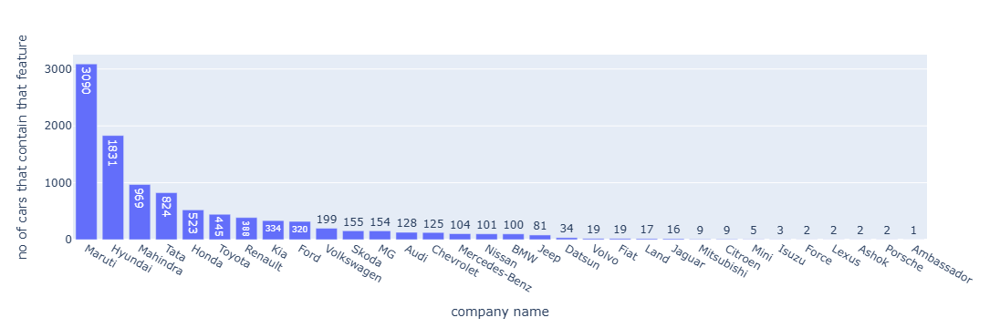

In [75]:
add_features=[]
for i in df['company_name'].values:
    add_features.append(i)
    
count_fea={}
for i in add_features:
    count_fea[i]=count_fea.get(i,0)+1
count_fea_sor=sorted(count_fea,key=lambda x:1/count_fea[x])
fig=px.bar(x=count_fea_sor,y=[count_fea[i] for i in count_fea_sor],text_auto=True)
fig.update_layout(xaxis_title="company name",yaxis_title='no of cars that contain that feature')

In [86]:
count_fea_wins={}
for comp in count_fea_sor:
    count_fea_wins[comp]=count_fea_wins.get(comp,0)+count_fea[comp]

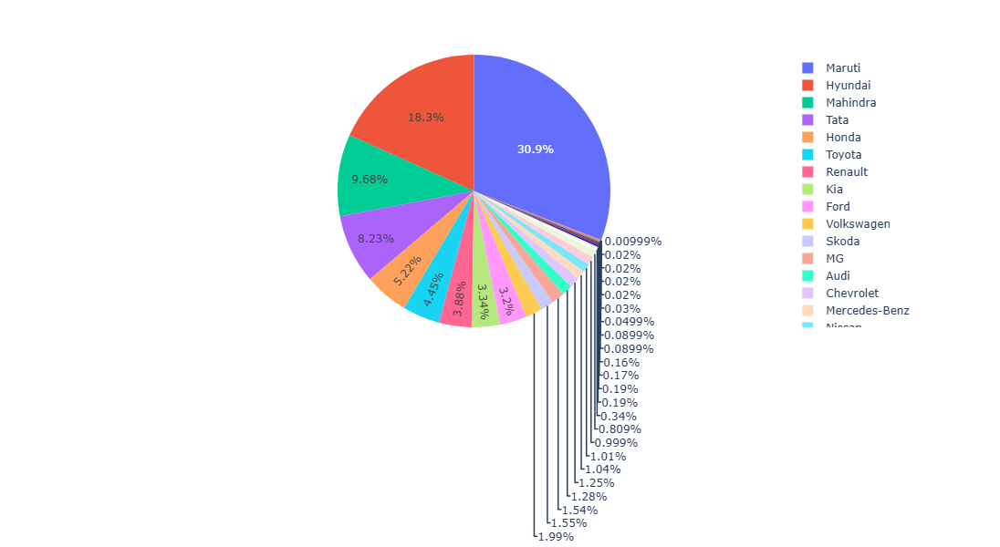

In [85]:
px.pie(names=count_fea_wins.keys(),values=[count_fea_wins[i] for i in count_fea_wins.keys()],height=600)

# model_detail

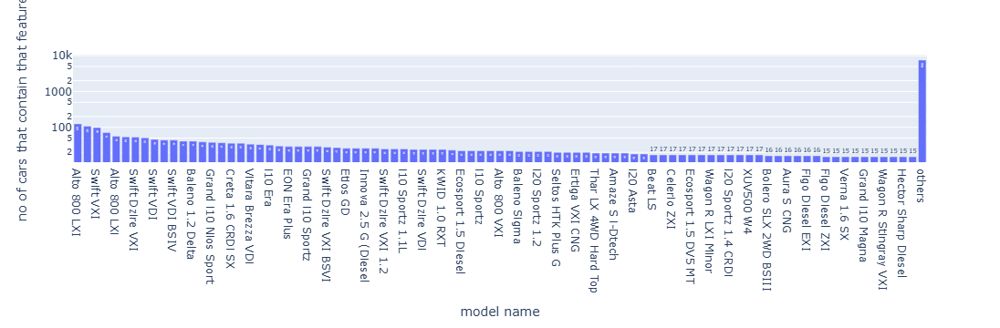

In [98]:
add_features=[]
for i in df['model_detail'].values:
    add_features.append(i)
    
count_fea={}
for i in add_features:
    count_fea[i]=count_fea.get(i,0)+1
count_fea_sor=sorted(count_fea,key=lambda x:1/count_fea[x])
count_fea_wins={}
for comp in count_fea_sor:
    if(count_fea[comp]<15):
        count_fea_wins['others']=count_fea_wins.get("others",0)+count_fea[comp]
    else:
        count_fea_wins[comp]=count_fea_wins.get(comp,0)+count_fea[comp]
        
fig=px.bar(x=[i[:20] for i in count_fea_wins.keys()],y=[count_fea_wins[i] for i in count_fea_wins.keys()],text_auto=True,log_y=True)
fig.update_layout(xaxis_title="model name",yaxis_title='no of cars that contain that feature')

# Multivariate analysis of registration year and year of manifacture with other columns

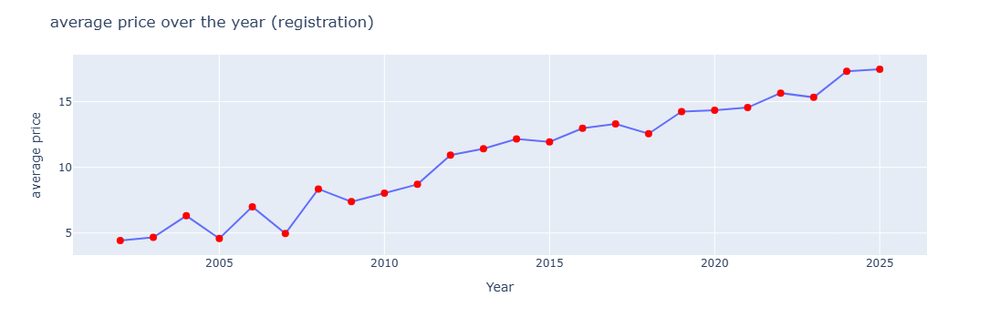

In [116]:
fig=px.line(x=df.groupby('Registration Year ')['new_vehical_price_in_lakh_inr'].mean().index,
       y=df.groupby('Registration Year ')['new_vehical_price_in_lakh_inr'].mean().values,markers='dot')
fig.update_layout(xaxis_title="Year",yaxis_title='average price',title="average price over the year (registration)")
fig.update_traces(marker=dict(size=8, color="red"))

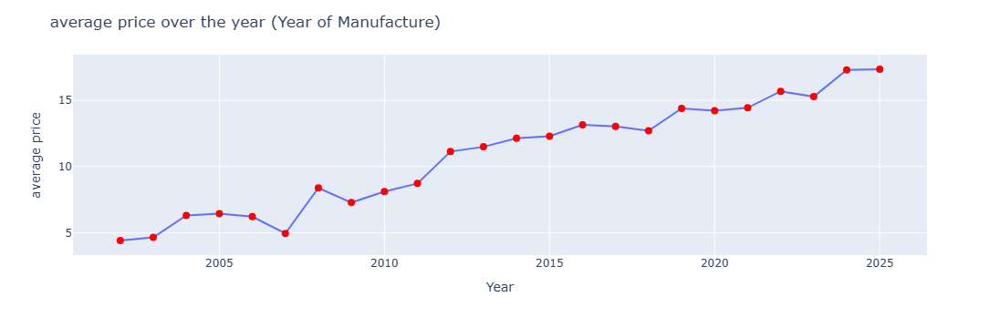

In [119]:
fig=px.line(x=df.groupby('Year of Manufacture ')['new_vehical_price_in_lakh_inr'].mean().index,
       y=df.groupby('Year of Manufacture ')['new_vehical_price_in_lakh_inr'].mean().values,markers='dot')
fig.update_layout(xaxis_title="Year",yaxis_title='average price',title="average price over the year (Year of Manufacture)")
fig.update_traces(marker=dict(size=8, color="red"))

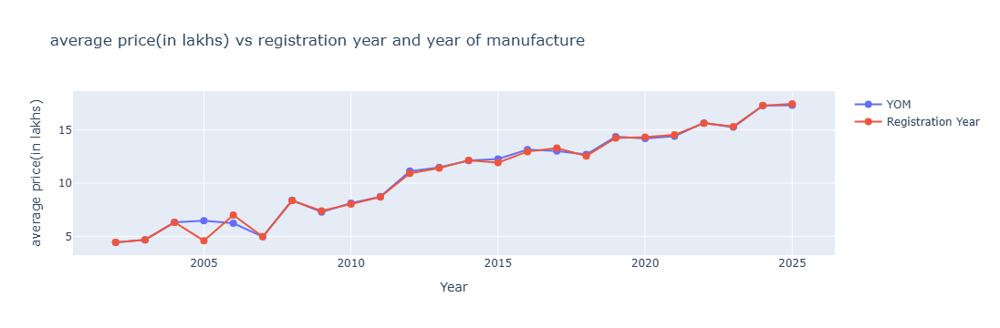

In [129]:
trace1=go.Scatter(x=df.groupby('Year of Manufacture ')['new_vehical_price_in_lakh_inr'].mean().index,
       y=df.groupby('Year of Manufacture ')['new_vehical_price_in_lakh_inr'].mean().values,
        mode='lines+markers',name='YOM',marker=dict(size=8, symbol='circle'),line=dict(width=2))
trace2=go.Scatter(x=df.groupby('Registration Year ')['new_vehical_price_in_lakh_inr'].mean().index,
       y=df.groupby('Registration Year ')['new_vehical_price_in_lakh_inr'].mean().values,
        mode='lines+markers',name='Registration Year ',marker=dict(size=8, symbol='circle'),line=dict(width=2))
layout=go.Layout(title=f'average price(in lakhs) vs registration year and year of manufacture ',
                 xaxis={"title":"Year"},yaxis={'title':"average price(in lakhs)"})
go.Figure(data=[trace1,trace2],layout=layout)

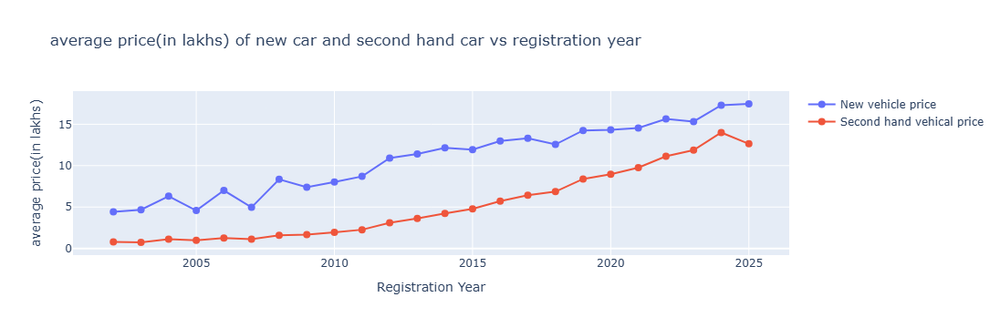

In [131]:
trace1=go.Scatter(x=df.groupby('Registration Year ')['new_vehical_price_in_lakh_inr'].mean().index,
       y=df.groupby('Registration Year ')['new_vehical_price_in_lakh_inr'].mean().values,
        mode='lines+markers',name='New vehicle price',marker=dict(size=8, symbol='circle'),line=dict(width=2))
trace2=go.Scatter(x=df.groupby('Registration Year ')['vehical_price_in_lakh_inr'].mean().index,
       y=df.groupby('Registration Year ')['vehical_price_in_lakh_inr'].mean().values,
        mode='lines+markers',name='Second hand vehical price',marker=dict(size=8, symbol='circle'),line=dict(width=2))
layout=go.Layout(title=f'average price(in lakhs) of new car and second hand car vs registration year ',
                 xaxis={"title":"Registration Year"},yaxis={'title':"average price(in lakhs)"})
go.Figure(data=[trace1,trace2],layout=layout)

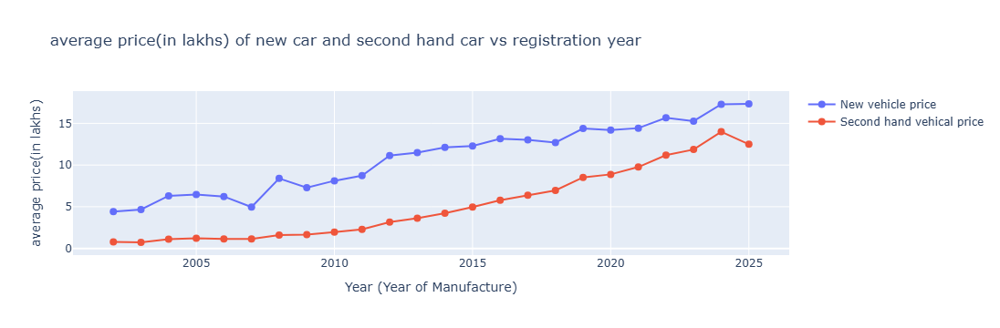

In [136]:
trace1=go.Scatter(x=df.groupby('Year of Manufacture ')['new_vehical_price_in_lakh_inr'].mean().index,
       y=df.groupby('Year of Manufacture ')['new_vehical_price_in_lakh_inr'].mean().values,
        mode='lines+markers',name='New vehicle price',marker=dict(size=8, symbol='circle'),line=dict(width=2))
trace2=go.Scatter(x=df.groupby('Year of Manufacture ')['vehical_price_in_lakh_inr'].mean().index,
       y=df.groupby('Year of Manufacture ')['vehical_price_in_lakh_inr'].mean().values,
        mode='lines+markers',name='Second hand vehical price',marker=dict(size=8, symbol='circle'),line=dict(width=2))
layout=go.Layout(title=f'average price(in lakhs) of new car and second hand car vs registration year ',
                 xaxis={"title":"Year (Year of Manufacture)"},yaxis={'title':"average price(in lakhs)"})
go.Figure(data=[trace1,trace2],layout=layout)

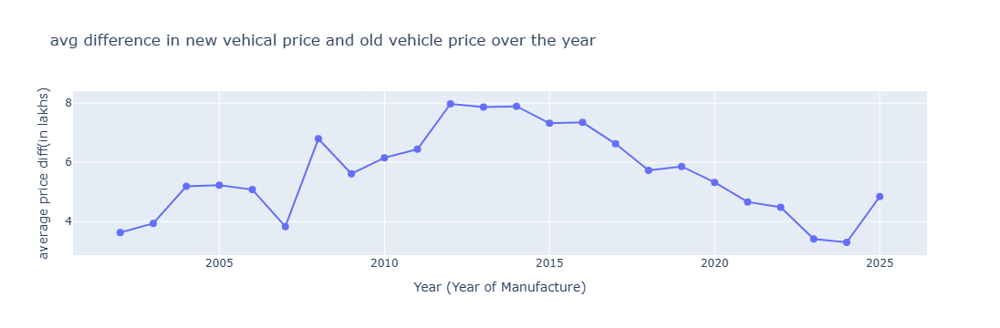

In [183]:
# difference in new vehicle price and old vehicle price over the year
gap=(df.groupby('Year of Manufacture ')['new_vehical_price_in_lakh_inr'].mean()-df.groupby('Year of Manufacture ')['vehical_price_in_lakh_inr'].mean())
trace1=go.Scatter(x=gap.index,
       y=gap.values,mode='lines+markers',marker=dict(size=8, symbol='circle'),line=dict(width=2))
layout=go.Layout(title=f'avg difference in new vehical price and old vehicle price over the year',
                 xaxis={"title":"Year (Year of Manufacture)"},yaxis={'title':"average price diff(in lakhs)"})
go.Figure(data=[trace1],layout=layout)

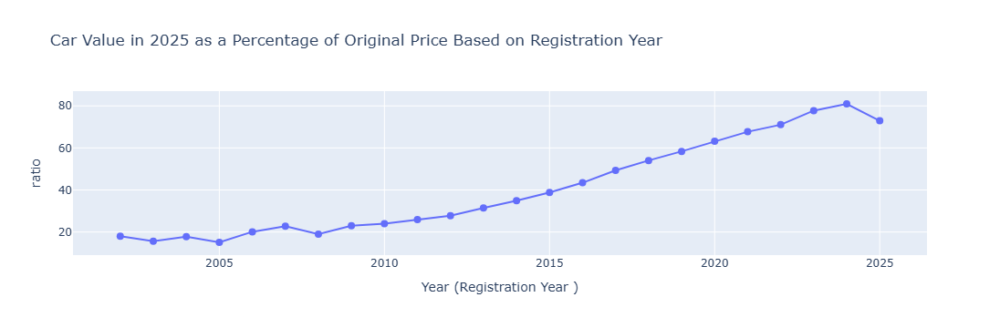

In [155]:
# "Projected 2025 Resale Value (% of Price in 2025) Based on Car Registration Year"

gap=df.groupby('Registration Year ')['vehical_price_in_lakh_inr'].mean()*100/df.groupby('Year of Manufacture ')['new_vehical_price_in_lakh_inr'].mean()
trace1=go.Scatter(x=gap.index,
       y=gap.values,mode='lines+markers',marker=dict(size=8, symbol='circle'),line=dict(width=2))
layout=go.Layout(title=f'Car Value in 2025 as a Percentage of new car Price Based on Registration Year',
                 xaxis={"title":"Year (Registration Year )"},yaxis={'title':"ratio"})
go.Figure(data=[trace1],layout=layout)

# This graph shows that a second-hand car registered in year R is expected to be worth y% of the price of a car with the same registration year in
# 2025, where y is the value corresponding to year R on the graph.

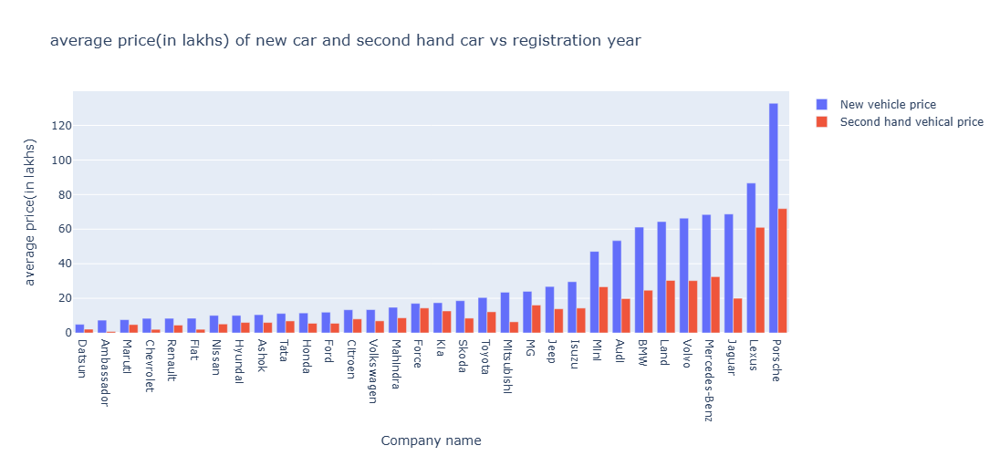

In [177]:
trace1=go.Bar(x=df.groupby('company_name')['new_vehical_price_in_lakh_inr'].mean().sort_values().index,
       y=df.groupby('company_name')['new_vehical_price_in_lakh_inr'].mean().sort_values().values,
        name='New vehicle price')
trace2=go.Bar(x=df.groupby('company_name')['vehical_price_in_lakh_inr'].mean().sort_values().index,
       y=df.groupby('company_name')['vehical_price_in_lakh_inr'].mean().sort_values().values,
        name='Second hand vehical price')
layout=go.Layout(title=f'average price(in lakhs) of new car and second hand car  ',
                 xaxis={"title":"Company name"},yaxis={'title':"average price(in lakhs)"},height=500)
go.Figure(data=[trace1,trace2],layout=layout)

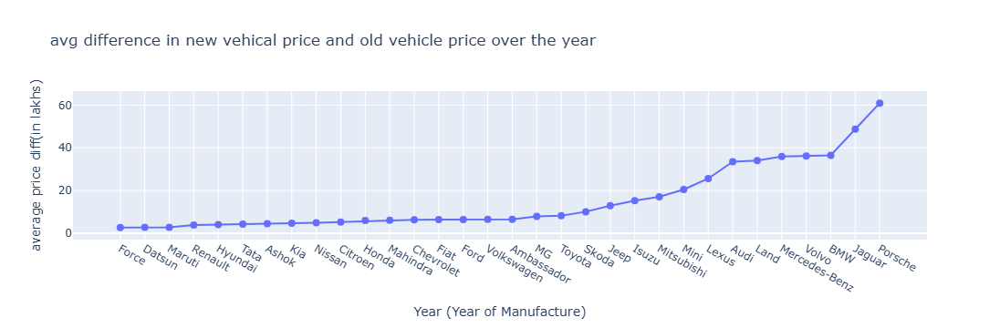

In [179]:
# difference in new vehicle price and old vehicle price over the year
gap=(df.groupby('company_name')['new_vehical_price_in_lakh_inr'].mean()-df.groupby('company_name')['vehical_price_in_lakh_inr'].mean()).sort_values()
trace1=go.Scatter(x=gap.index,
       y=gap.values,mode='lines+markers',marker=dict(size=8, symbol='circle'),line=dict(width=2))
layout=go.Layout(title=f'avg difference in new vehical price and old vehicle',
                 xaxis={"title":"Year (Year of Manufacture)"},yaxis={'title':"average price diff(in lakhs)"})
go.Figure(data=[trace1],layout=layout)

# interpretation for any car of company C you will we be getting Y lakh less when you resale it (as of it's price in year 2025)

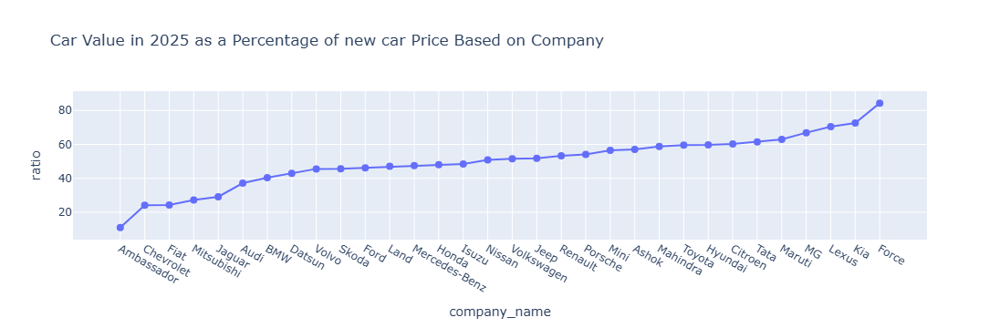

In [181]:
# "Projected 2025 Resale Value (% of Price in 2025) Based on Car Company"

gap=(df.groupby('company_name')['vehical_price_in_lakh_inr'].mean()*100/df.groupby('company_name')['new_vehical_price_in_lakh_inr'].mean()).sort_values()
trace1=go.Scatter(x=gap.index,
       y=gap.values,mode='lines+markers',marker=dict(size=8, symbol='circle'),line=dict(width=2))
layout=go.Layout(title=f'Car Value in 2025 as a Percentage of new car Price Based on Company',
                 xaxis={"title":"company_name"},yaxis={'title':"ratio"})
go.Figure(data=[trace1],layout=layout)

# This graph shows that a second-hand car from company C is expected to be worth y% of the price of a car from the same company in 2025,
# where y is the value corresponding to company C on the graph.

# like if you have a porsche from whichever year you will be getting around 54% of the price of same new car in 2025

# note this graph don't depict exact resale percentage for comp with other companies because in that it is possible that car with higher resale 
# percentage have more no of cars of recent year which increase their resale value due to less age

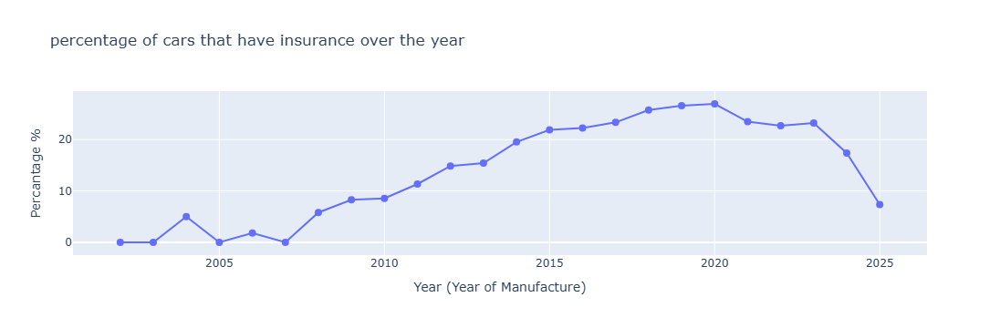

In [204]:
# percentage of cars (available for second hand buying) that have insurance over the year

gap=(df[df['Insurance ']!='No Insurance'].groupby('Year of Manufacture ')['Insurance '].count()*100/df.groupby('Year of Manufacture ')['Insurance '].count()).fillna(0)
trace1=go.Scatter(x=gap.index,
       y=gap.values,mode='lines+markers',marker=dict(size=8, symbol='circle'),line=dict(width=2))
layout=go.Layout(title=f'percentage of cars that have insurance over the year',
                 xaxis={"title":"Year (Year of Manufacture)"},yaxis={'title':"Percantage %"})
go.Figure(data=[trace1],layout=layout)

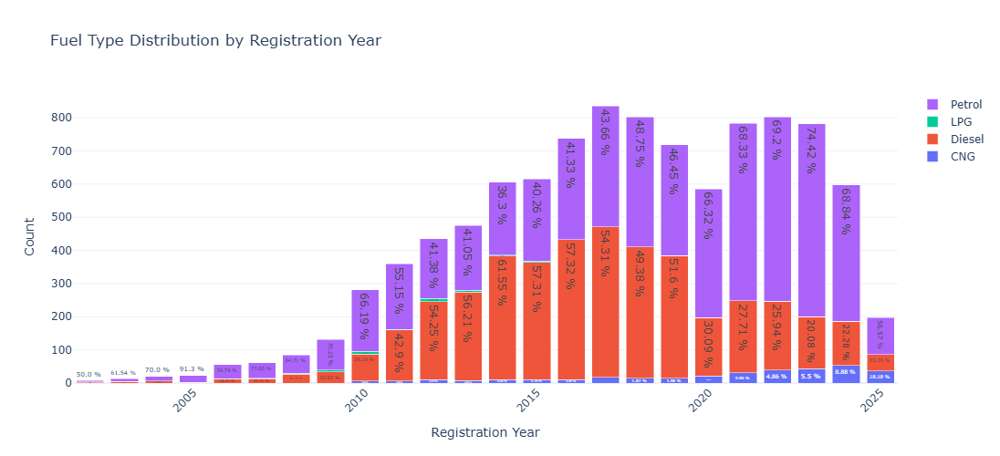

In [284]:
# stcked bar chart showing percentage of each fuel type over the year
mfd=df.groupby(['Registration Year ','Fuel Type ']).size().unstack(fill_value=0)
txt=(df.groupby(['Registration Year ','Fuel Type ']).size()*100/df.groupby('Registration Year ')['Fuel Type '].count()).unstack(fill_value=0)
data=[]
for fuels in np.unique(df['Fuel Type '].values):
    data.append(go.Bar(x=mfd.index,y=mfd[fuels],name=fuels,text=[f"{round(i,2)} % " for i in txt[fuels]]))

fig=go.Figure(data=data,layout=None)
fig.update_layout(
    barmode='stack',
    title='Fuel Type Distribution by Registration Year',
    xaxis_title='Registration Year',
    yaxis_title='Count',
    xaxis_tickangle=-45,
    template='plotly_white',
    height=500
)

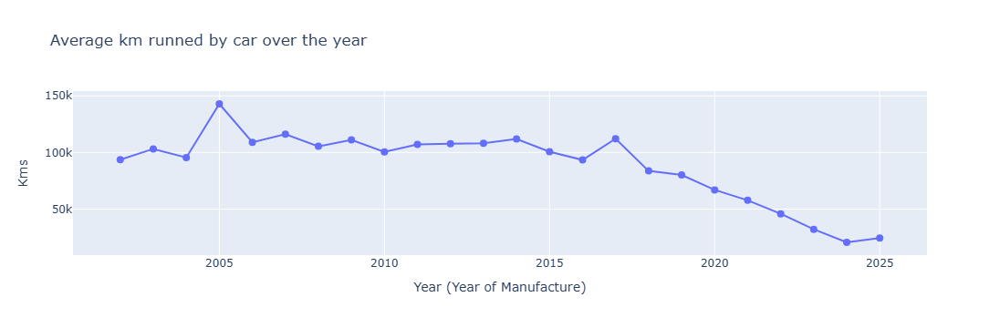

In [11]:
# registration and kms driven
mean_km=df.groupby(['Year of Manufacture '])['Kms Driven '].mean().apply(lambda x:round(x,2))
trace1=go.Scatter(x=mean_km.index,
       y=mean_km.values,mode='lines+markers',marker=dict(size=8, symbol='circle'),line=dict(width=2))
layout=go.Layout(title=f'Average km runned by car over the year',
                 xaxis={"title":"Year (Year of Manufacture)"},yaxis={'title':"Kms"})
go.Figure(data=[trace1],layout=layout)

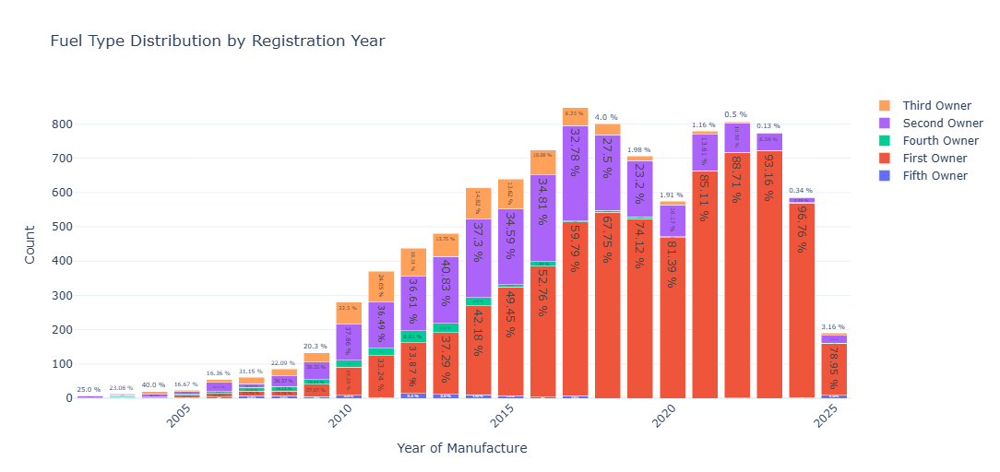

In [13]:
# ownership over the year 
mfd=df.groupby(['Year of Manufacture ','Ownership ']).size().unstack(fill_value=0)
txt=(df.groupby(['Year of Manufacture ','Ownership ']).size()*100/df.groupby('Year of Manufacture ')['Fuel Type '].count()).unstack(fill_value=0)
data=[]
for fuels in np.unique(df['Ownership '].values):
    data.append(go.Bar(x=mfd.index,y=mfd[fuels],name=fuels,text=[f"{round(i,2)} % " for i in txt[fuels]]))

fig=go.Figure(data=data,layout=None)
fig.update_layout(
    barmode='stack',
    title='Fuel Type Distribution by Registration Year',
    xaxis_title='Year of Manufacture',
    yaxis_title='Count',
    xaxis_tickangle=-45,
    template='plotly_white',
    height=500
)

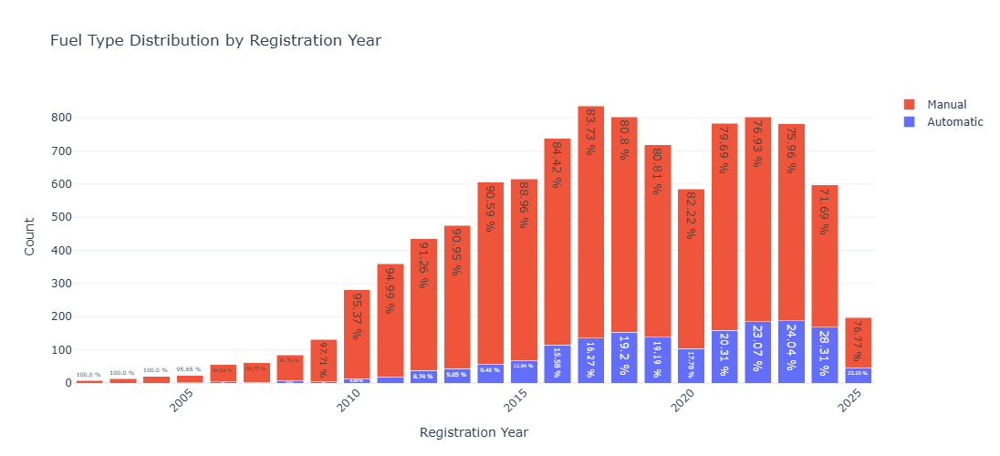

In [14]:
# Transmission over the year 
mfd=df.groupby(['Registration Year ','Transmission ']).size().unstack(fill_value=0)
txt=(df.groupby(['Registration Year ','Transmission ']).size()*100/df.groupby('Registration Year ')['Fuel Type '].count()).unstack(fill_value=0)
data=[]
for fuels in np.unique(df['Transmission '].values):
    data.append(go.Bar(x=mfd.index,y=mfd[fuels],name=fuels,text=[f"{round(i,2)} % " for i in txt[fuels]]))

fig=go.Figure(data=data,layout=None)
fig.update_layout(
    barmode='stack',
    title='Transmission over the Registration Year',
    xaxis_title='Registration Year',
    yaxis_title='Count',
    xaxis_tickangle=-45,
    template='plotly_white',
    height=500
)

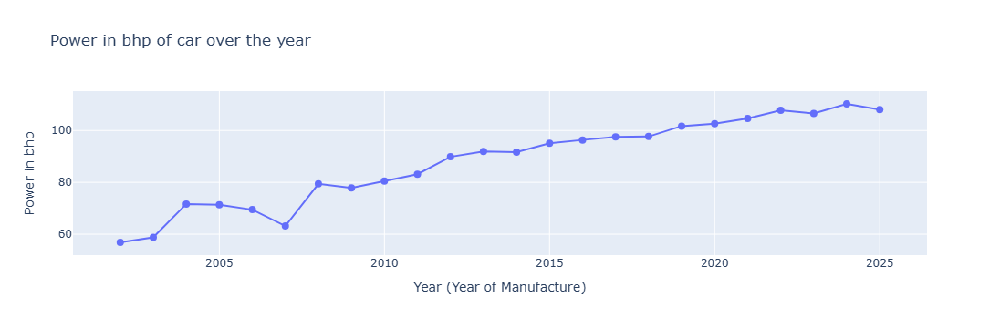

In [20]:
# Power in bhp over the year 
mean_km=df.groupby(['Year of Manufacture '])['Power in bhp'].mean().apply(lambda x:round(x,2))
trace1=go.Scatter(x=mean_km.index,
       y=mean_km.values,mode='lines+markers',marker=dict(size=8, symbol='circle'),line=dict(width=2))
layout=go.Layout(title=f'Power in bhp of car over the year',
                 xaxis={"title":"Year (Year of Manufacture)"},yaxis={'title':"Power in bhp"})
go.Figure(data=[trace1],layout=layout)

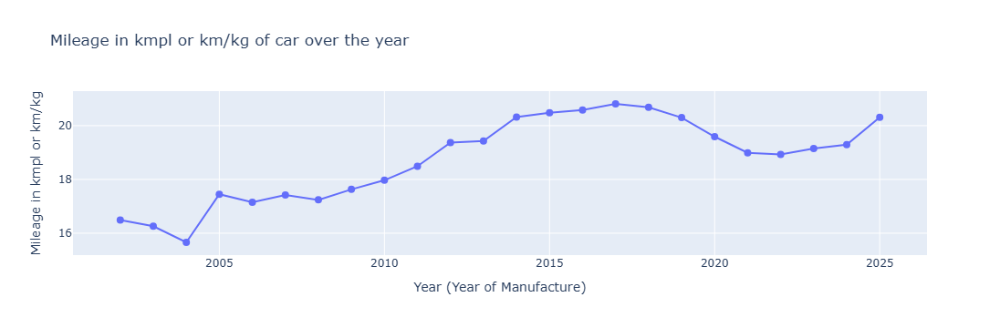

In [21]:
# Mileage in kmpl or km/kg over the year 
mean_km=df.groupby(['Year of Manufacture '])['Mileage in kmpl or km/kg'].mean().apply(lambda x:round(x,2))
trace1=go.Scatter(x=mean_km.index,
       y=mean_km.values,mode='lines+markers',marker=dict(size=8, symbol='circle'),line=dict(width=2))
layout=go.Layout(title=f'Mileage in kmpl or km/kg of car over the year',
                 xaxis={"title":"Year (Year of Manufacture)"},yaxis={'title':"Mileage in kmpl or km/kg"})
go.Figure(data=[trace1],layout=layout)

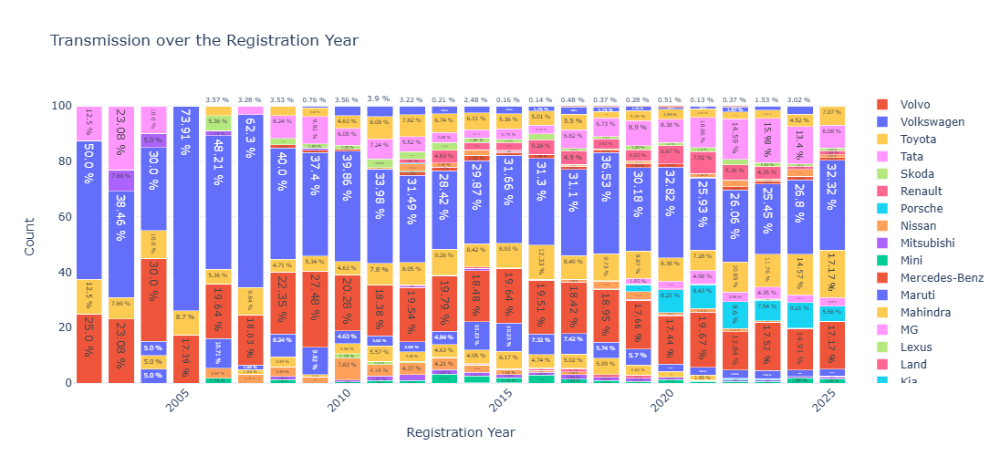

In [28]:
# Transmission over the year 
mfd=df.groupby(['Registration Year ','company_name']).size().unstack(fill_value=0)
txt=(df.groupby(['Registration Year ','company_name']).size()*100/df.groupby('Registration Year ')['company_name'].count()).unstack(fill_value=0)
data=[]
total_cars=df['Registration Year '].value_counts()
for fuels in np.unique(df['company_name'].values):
    data.append(go.Bar(x=mfd.index,y=mfd[fuels]*100/total_cars,name=fuels,text=[f"{round(i,2)} % " for i in txt[fuels]]))

fig=go.Figure(data=data,layout=None)
fig.update_layout(
    barmode='stack',
    title='Transmission over the Registration Year',
    xaxis_title='Registration Year',
    yaxis_title='Count',
    xaxis_tickangle=-45,
    template='plotly_white',
    height=500
)

# Insurance multivariate analysis

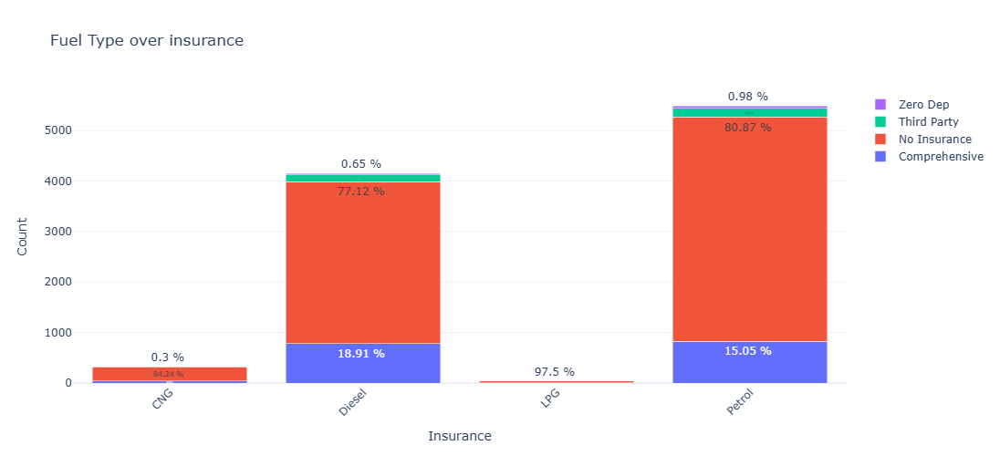

In [35]:
# Insurance over the Fuel Type
mfd=df.groupby(['Fuel Type ','Insurance ']).size().unstack(fill_value=0)
txt=(df.groupby(['Fuel Type ','Insurance ']).size()*100/df.groupby('Fuel Type ')['Insurance '].count()).unstack(fill_value=0)
data=[]
for fuels in np.unique(df['Insurance '].values):
    data.append(go.Bar(x=mfd.index,y=mfd[fuels],name=fuels,text=[f"{round(i,2)} % " for i in txt[fuels]]))

fig=go.Figure(data=data,layout=None)
fig.update_layout(
    barmode='stack',
    title='Fuel Type over insurance',
    xaxis_title='Insurance ',
    yaxis_title='Count',
    xaxis_tickangle=-45,
    template='plotly_white',
    height=500
)

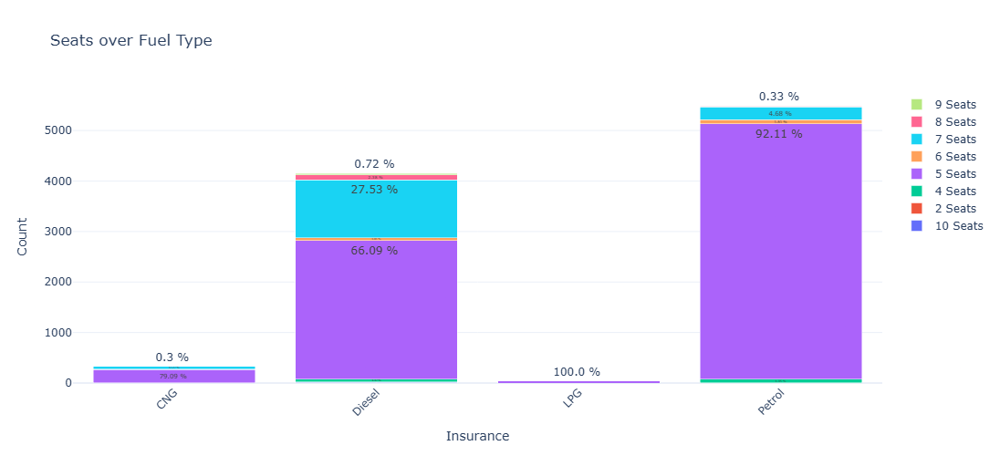

In [36]:
# Insurance over the Fuel Type
mfd=df.groupby(['Fuel Type ','Seats ']).size().unstack(fill_value=0)
txt=(df.groupby(['Fuel Type ','Seats ']).size()*100/df.groupby('Fuel Type ')['Seats '].count()).unstack(fill_value=0)
data=[]
for fuels in np.unique(df['Seats '].values):
    data.append(go.Bar(x=mfd.index,y=mfd[fuels],name=fuels,text=[f"{round(i,2)} % " for i in txt[fuels]]))

fig=go.Figure(data=data,layout=None)
fig.update_layout(
    barmode='stack',
    title='Seats over Fuel Type',
    xaxis_title='Insurance ',
    yaxis_title='Count',
    xaxis_tickangle=-45,
    template='plotly_white',
    height=500
)

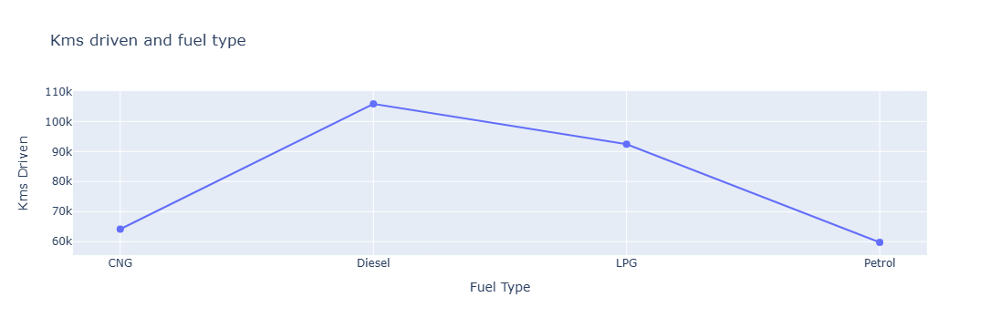

In [39]:
mean_km=df.groupby(['Fuel Type '])['Kms Driven '].mean().apply(lambda x:round(x,2))
trace1=go.Scatter(x=mean_km.index,
       y=mean_km.values,mode='lines+markers',marker=dict(size=8, symbol='circle'),line=dict(width=2))
layout=go.Layout(title=f'Kms driven and fuel type',
                 xaxis={"title":"Fuel Type"},yaxis={'title':"Kms Driven"})
go.Figure(data=[trace1],layout=layout)

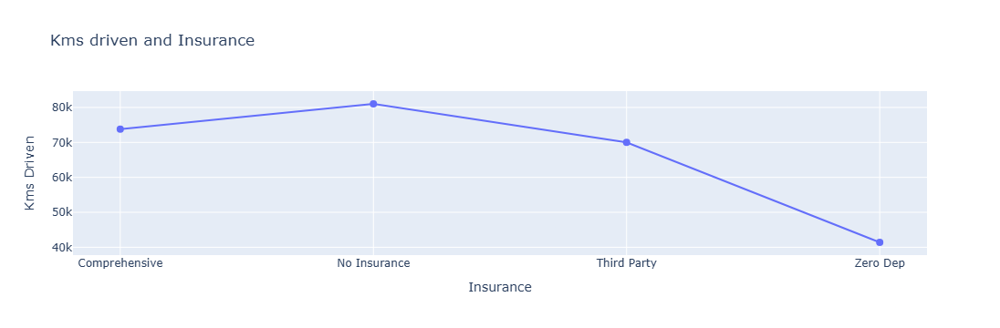

In [40]:
mean_km=df.groupby(['Insurance '])['Kms Driven '].mean().apply(lambda x:round(x,2))
trace1=go.Scatter(x=mean_km.index,
       y=mean_km.values,mode='lines+markers',marker=dict(size=8, symbol='circle'),line=dict(width=2))
layout=go.Layout(title=f'Kms driven and Insurance ',
                 xaxis={"title":"Insurance "},yaxis={'title':"Kms Driven"})
go.Figure(data=[trace1],layout=layout)

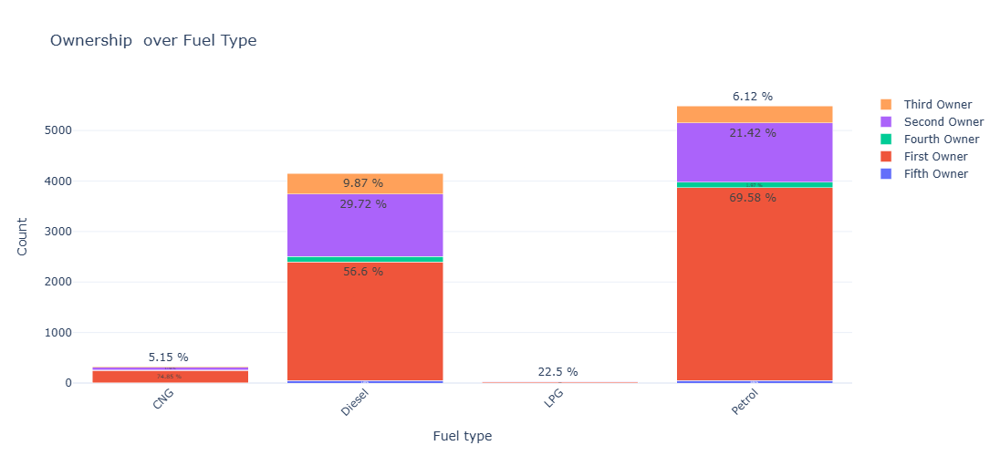

In [44]:
mfd=df.groupby(['Fuel Type ','Ownership ']).size().unstack(fill_value=0)
txt=(df.groupby(['Fuel Type ','Ownership ']).size()*100/df.groupby('Fuel Type ')['Ownership '].count()).unstack(fill_value=0)
data=[]
for fuels in np.unique(df['Ownership '].values):
    data.append(go.Bar(x=mfd.index,y=mfd[fuels],name=fuels,text=[f"{round(i,2)} % " for i in txt[fuels]]))

fig=go.Figure(data=data,layout=None)
fig.update_layout(
    barmode='stack',
    title='Ownership  over Fuel Type',
    xaxis_title='Fuel type ',
    yaxis_title='Count',
    xaxis_tickangle=-45,
    template='plotly_white',
    height=500
)

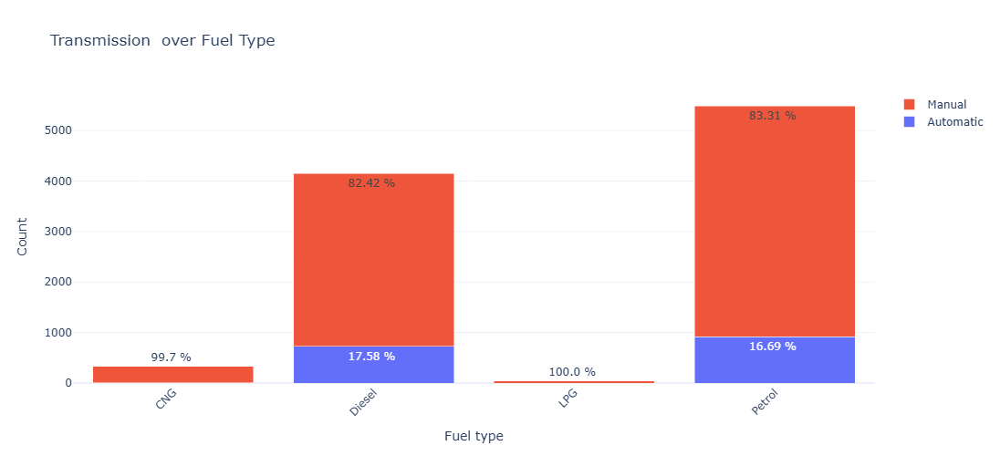

In [46]:
mfd=df.groupby(['Fuel Type ','Transmission ']).size().unstack(fill_value=0)
txt=(df.groupby(['Fuel Type ','Transmission ']).size()*100/df.groupby('Fuel Type ')['Transmission '].count()).unstack(fill_value=0)
data=[]
for fuels in np.unique(df['Transmission '].values):
    data.append(go.Bar(x=mfd.index,y=mfd[fuels],name=fuels,text=[f"{round(i,2)} % " for i in txt[fuels]]))

fig=go.Figure(data=data,layout=None)
fig.update_layout(
    barmode='stack',
    title='Transmission  over Fuel Type',
    xaxis_title='Fuel type ',
    yaxis_title='Count',
    xaxis_tickangle=-45,
    template='plotly_white',
    height=500
)

In [41]:
df.head(3)

,Registration Year,Insurance,Fuel Type,Seats,Kms Driven,RTO,Ownership,Transmission,Year of Manufacture,Power in bhp,Mileage in kmpl or km/kg,new_vehical_price_in_lakh_inr,vehical_price_in_lakh_inr,other_features,company_name,model_detail,Engine Displacement in cc
0,2013,No Insurance,Diesel,5 Seats,150000,Sri Ganganagar,Fourth Owner,Manual,2013,67.04,23.59,8.05,2.60,[],Toyota,Etios GD,1364.0
1,2024,No Insurance,Petrol,5 Seats,10000,dasuya,First Owner,Manual,2024,88.50,22.35,11.28,9.40,[],Toyota,Glanza V,1197.0
2,2017,Comprehensive,Diesel,5 Seats,75000,Gurgaon,First Owner,Manual,2017,88.70,22.10,11.86,6.25,[],Hyundai,Creta 1.4 E Plus,1396.0


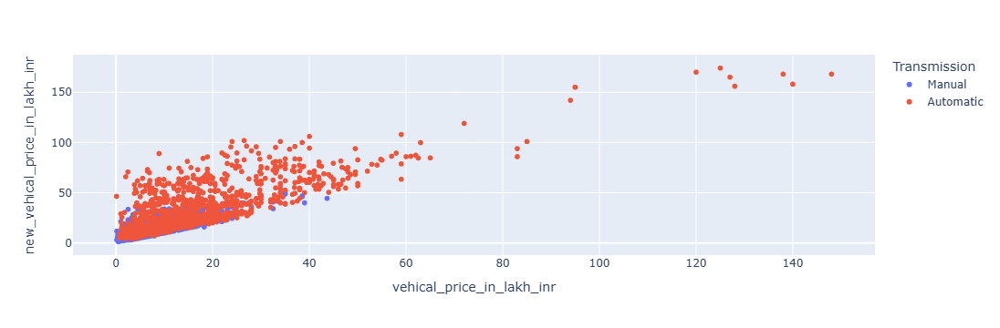

In [54]:
px.scatter(df,x='vehical_price_in_lakh_inr',y='new_vehical_price_in_lakh_inr',color='Transmission ',hover_data='Registration Year ')
# maual cars have a greater resale value

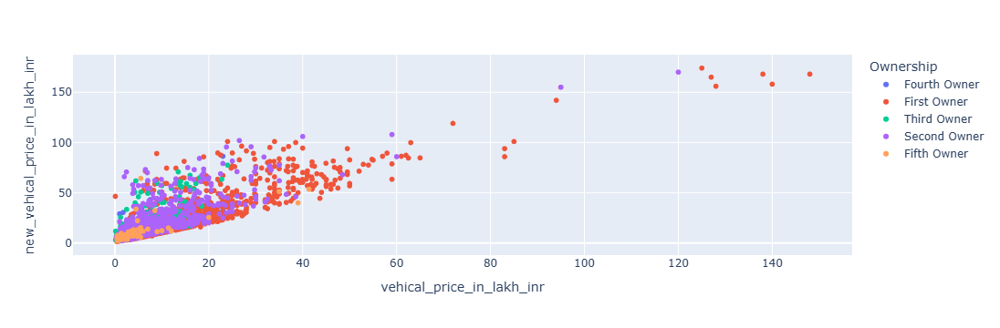

In [55]:
px.scatter(df,x='vehical_price_in_lakh_inr',y='new_vehical_price_in_lakh_inr',color='Ownership ',hover_data='Registration Year ')

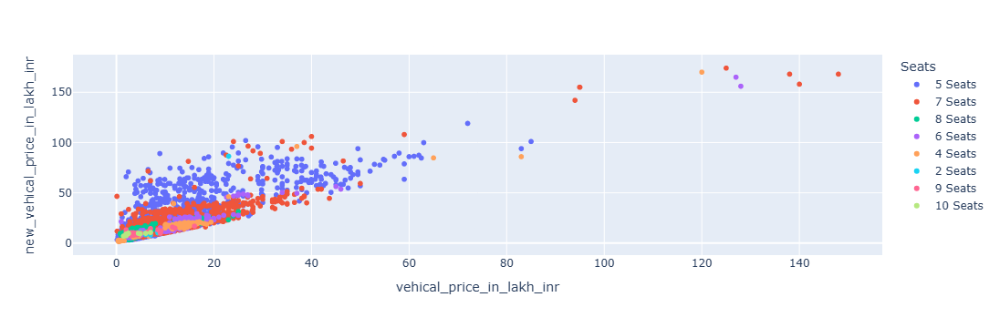

In [56]:
px.scatter(df,x='vehical_price_in_lakh_inr',y='new_vehical_price_in_lakh_inr',color='Seats ',hover_data='Registration Year ')

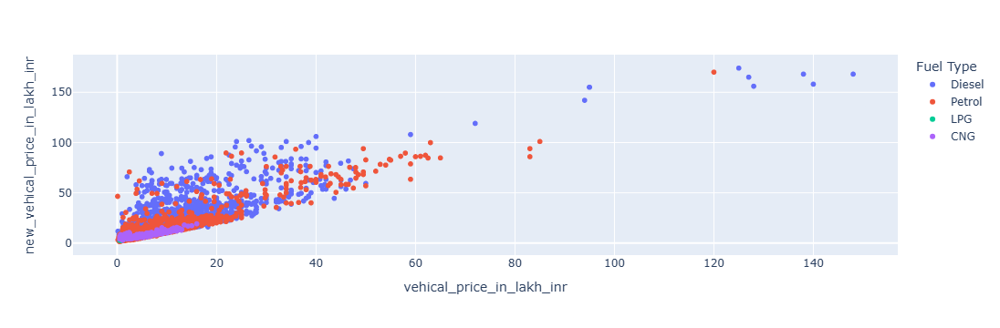

In [59]:
px.scatter(df,x='vehical_price_in_lakh_inr',y='new_vehical_price_in_lakh_inr',color='Fuel Type ',hover_data='Registration Year ')

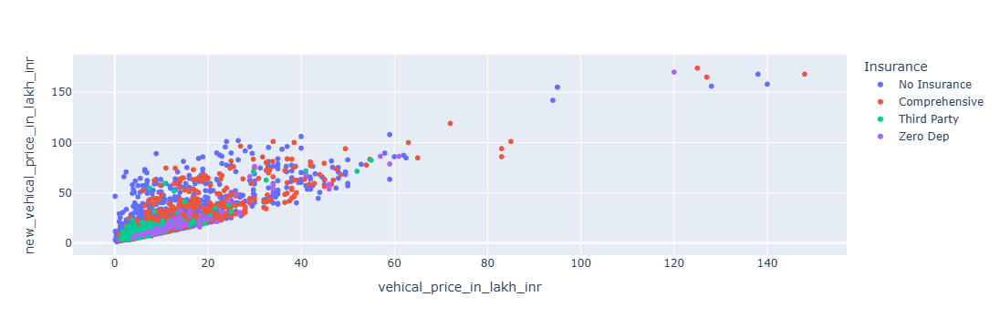

In [57]:
px.scatter(df,x='vehical_price_in_lakh_inr',y='new_vehical_price_in_lakh_inr',color='Insurance ',hover_data='Registration Year ')

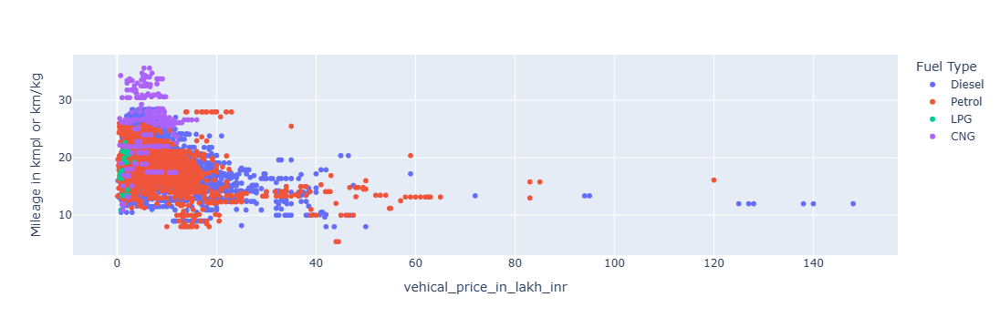

In [70]:
px.scatter(df,x='vehical_price_in_lakh_inr',y='Mileage in kmpl or km/kg',color='Fuel Type ',hover_data=['model_detail','company_name'])

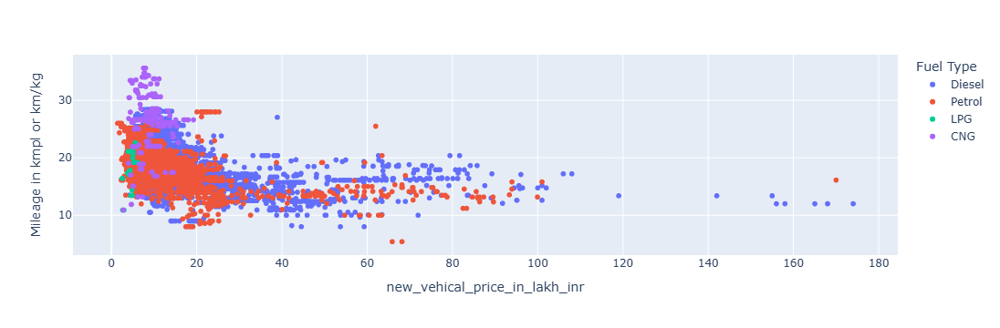

In [69]:
px.scatter(df,x='new_vehical_price_in_lakh_inr',y='Mileage in kmpl or km/kg',color='Fuel Type ',hover_data=['model_detail','company_name'])

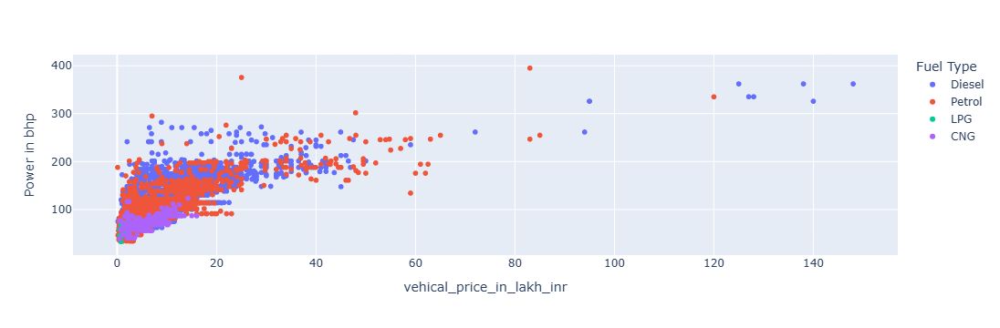

In [66]:
px.scatter(df,x='vehical_price_in_lakh_inr',y='Power in bhp',color='Fuel Type ',hover_data=['model_detail','company_name'])

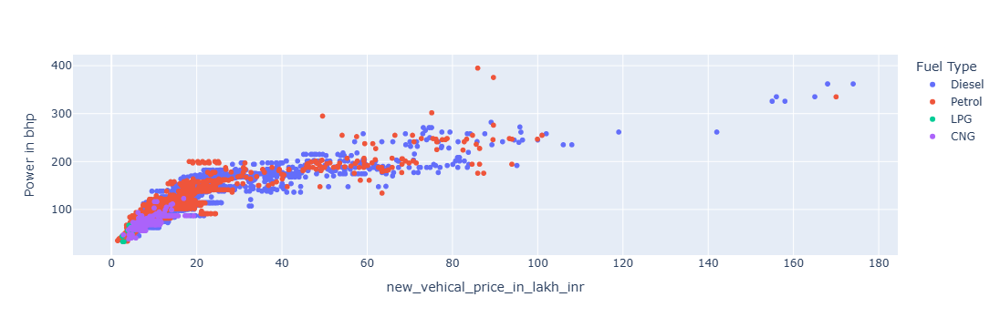

In [71]:
px.scatter(df,x='new_vehical_price_in_lakh_inr',y='Power in bhp',color='Fuel Type ',hover_data=['model_detail','company_name'])

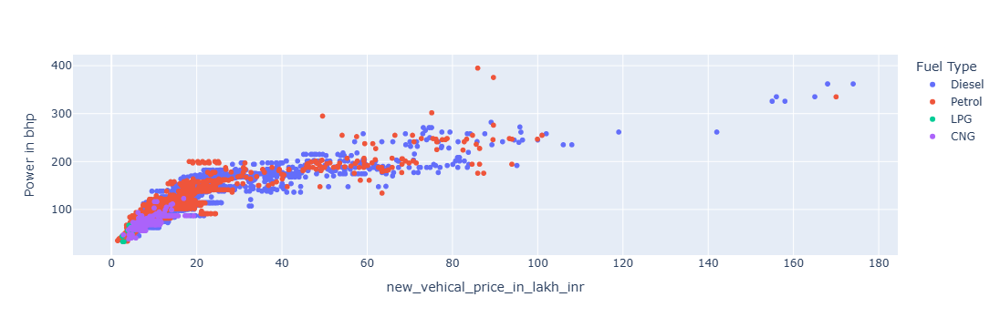

In [71]:
px.scatter(df,x='new_vehical_price_in_lakh_inr',y='Power in bhp',color='Fuel Type ',hover_data=['model_detail','company_name'])

In [ ]:
trace1=go.Scatter(x=df.groupby('Year of Manufacture ')['new_vehical_price_in_lakh_inr'].mean().index,
       y=df.groupby('Year of Manufacture ')['new_vehical_price_in_lakh_inr'].mean().values,
        mode='lines+markers',name='New vehicle price',marker=dict(size=8, symbol='circle'),line=dict(width=2))
trace2=go.Scatter(x=df.groupby('Year of Manufacture ')['vehical_price_in_lakh_inr'].mean().index,
       y=df.groupby('Year of Manufacture ')['vehical_price_in_lakh_inr'].mean().values,
        mode='lines+markers',name='Second hand vehical price',marker=dict(size=8, symbol='circle'),line=dict(width=2))
layout=go.Layout(title=f'average price(in lakhs) of new car and second hand car vs registration year ',
                 xaxis={"title":"Year (Year of Manufacture)"},yaxis={'title':"average price(in lakhs)"})
go.Figure(data=[trace1,trace2],layout=layout)

In [65]:
df.head(1)

,Registration Year,Insurance,Fuel Type,Seats,Kms Driven,RTO,Ownership,Transmission,Year of Manufacture,Power in bhp,Mileage in kmpl or km/kg,new_vehical_price_in_lakh_inr,vehical_price_in_lakh_inr,other_features,company_name,model_detail,Engine Displacement in cc
0,2013,No Insurance,Diesel,5 Seats,150000,Sri Ganganagar,Fourth Owner,Manual,2013,67.04,23.59,8.05,2.6,[],Toyota,Etios GD,1364.0
